# Лабораторная работа №4. Синтез КИХ-фильтров.
## Вариант №15

Лаборатория цифровой обработки сигналов, МФТИ

Вклад задач в итоговую оценку: 1.1-3.2 — 1 балл, 4.1 — 2 балла. Максимальная оценка ограничивается с момента наступления срока сдачи следующей лабораторной работы.

В названии файла заменить `familyname` на свою фамилию. 

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import plotly.express as px
import plotly.graph_objects as go
plt.rcParams.update({'font.size': 20})

|      Вариант                                                                  | 1    | 2    | 3    |      4 | 5    | 6    | 7    | 8    | 9    | 10   | 11   | 12   | 13   | 14   | 15   | 16   | 17   | 18   | 19   | 20   |
|:-----------------------------------------------------------------------|:-----|:-----|:-----|:-------|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|:-----|
| Частота  дискретизации $f_s$, кГц                                      | 100  | 100  | 100  | 100    | 100  | 200  | 200  | 200  | 200  | 200  | 100  | 100  | 100  | 100  | 100  | 200  | 200  | 200  | 200  | 200  |
| Граничная частота полосы пропускания $f_1$, кГц                        | 10   | 9    | 11   |  12    | 15   | 20   | 21   | 23   | 24   | 25   | 9    | 10   | 11   | 12   | 13   | 26   | 27   | 28   | 29   | 30   |
| Граничная частота полосы задерживания $f_2$, кГц                        | 12   | 11   | 13   |  14    | 17   | 22   | 23   | 25   | 26   | 27   | 11   | 12   | 13   | 14   | 15   | 28   | 29   | 30   | 31   | 32   |
| Максимально допустимое отклонение АЧХ в полосе пропускания $\delta_1$  | 0.05 | 0.06 | 0.04 |   0.05 | 0.04 | 0.05 | 0.06 | 0.04 | 0.05 | 0.04 | 0.05 | 0.06 | 0.04 | 0.05 | 0.04 | 0.05 | 0.06 | 0.04 | 0.05 | 0.04 |
| Максимально допустимое отклонение АЧХ в полосе задерживания $\delta_2$ | 0.02 | 0.03 | 0.01 |   0.02 | 0.02 | 0.03 | 0.03 | 0.02 | 0.03 | 0.03 | 0.03 | 0.02 | 0.03 | 0.02 | 0.02 | 0.03 | 0.03 | 0.02 | 0.02 | 0.02 |
| Несущая частота $f_0$, кГц                                             | 3,9  | 3,8  | 3,9  |   4    | 4,6  | 5,9  | 6,5  | 6,7  | 8,1  | 7,4  | 4,5  | 5,1  | 4,3  | 5,2  | 5,3  | 5,7  | 8,2  | 9,1  | 8,7  | 9,5  |

In [47]:
fs = 100000
f1 =  13000
f2 =  15000
delta1 = 0.04
delta2 = 0.02
f0 = 5300

# Модуль 1. Метод частотной выборки синтеза КИХ-фильтров

## Задача 1.1. Синтез ФНЧ по идеальной АЧХ. 

Синтезировать КИХ-фильтр 28 порядка ($N=29$) на основе идеального фильтра нижних частот с частотой среза $f_c=(f_1+f_2)/2$ методом частотной выборки. Частоту дискретизации принять равной $f_s$.

а) Определить максимальные уровни пульсаций $\delta_1$ и $\delta_2$ в полосе пропускания и в полосе задерживания. 

б) Изобразить на одном графике АЧХ фильтра и отсчеты ДПФ. 

в) Построить импульсную характеристику КИХ-фильтра. Определить по виду импульсной характеристики, будет ли фильтр обладать постоянной фазовой и группой задержками.

г) Получить график для групповой задержки фильтра. Сравнить с выводом в пункте (в).

##### 1.1 Б) Изображённый АЧХ фильтра и отсчёты ДПФ

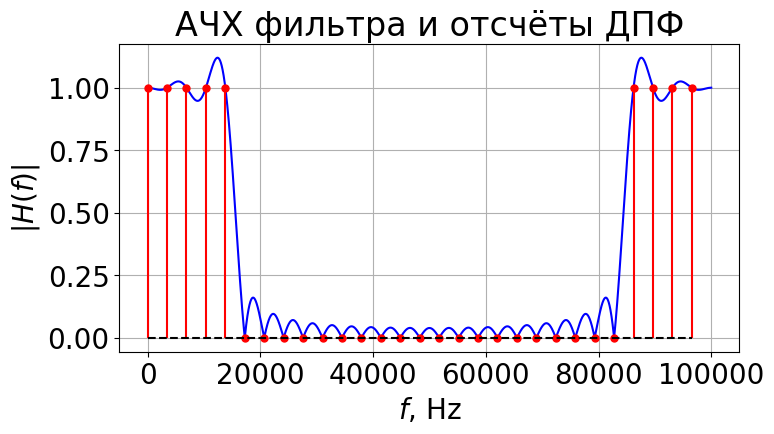

In [48]:
fc = (f1 + f2)/2
N = 29

@np.vectorize
def ideal_lowpass(f, fc, fs):
    if 0 <= f <= fc or fs-fc <= f <= fs:
        return 1.0 + 0.0j
    else:
        return 0.0 + 0.0j

plt.figure(figsize=(8,4))

H = ideal_lowpass(fs*np.arange(N)/N, fc=fc, fs=fs)
h = np.roll(np.fft.ifft(H), N//2)
M = 1024*8
H1 = abs(np.fft.fft(h, M))

plt.plot(fs*(np.arange(M)/M), abs(H1), color = 'blue')

ml, sl, bl = plt.stem(fs*np.arange(N)/N, abs(H), 'r', basefmt = 'k--', markerfmt = 'ro')
plt.setp(ml, markersize = 5)

if False:
    plt.axvline(x=fc, label='fc')
    plt.axvline(x=f1, label='f1')
    plt.axvline(x=f2, label='f2')
    plt.legend()

plt.xlabel("$f$, Hz")
plt.ylabel("$|H(f)|$")
plt.title("АЧХ фильтра и отсчёты ДПФ")
plt.grid()
plt.show()
plt.close()


f_band = np.linspace(0, fs, 10240)

##### 1.1 А) Максимальные уровни пульсаций $\delta_1$ и $\delta_2$ в полосе пропускания и в полосе задерживания. 

In [49]:
print(f"макс пульсация в полосе пропускания = {np.round(np.max(20*np.log10(abs(abs(H1)[np.where(fs*(np.arange(M)/M)<=f1)]-1))),1)} дБ")
print(f"макс пульсация в полосе задерживания = {np.round(np.max(20*np.log10(abs(H1))[np.logical_and(fs*np.arange(M)/M>=f2,fs*(np.arange(M)/M)<=fs-f2)]),1)} дБ")

макс пульсация в полосе пропускания = -18.4 дБ
макс пульсация в полосе задерживания = -3.2 дБ


##### 1.1 В) Импульсная характеристика КИХ-фильтра. Определить по виду импульсной характеристики, будет ли фильтр обладать постоянной фазовой и группой задержками.

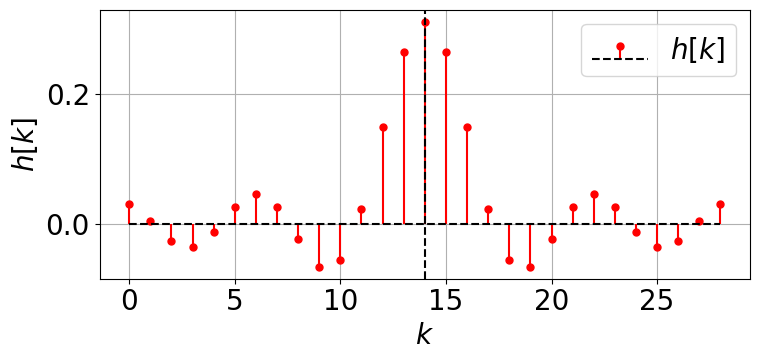

In [50]:
fig, ax = plt.subplots(figsize=(8, 4))
H = ideal_lowpass(fs*np.arange(N)/N, fc=fc, fs=fs)
h = np.roll(np.fft.ifft(H), N//2)
ml, sl, bl = plt.stem(np.arange(N), h.real, 'r', basefmt = 'k--', markerfmt = 'ro', 
                          label="$h[k]$")
plt.setp(ml, markersize = 5)
plt.axvline(N//2, ls = '--', color = 'black')
    
plt.grid()
plt.ylabel('$h[k]$')
plt.xlabel('$k$')

plt.legend(loc = 'best')
plt.tight_layout()
plt.show()
plt.close()

| Параметр  | Значение |
|-----------|----------|
| N = 29    | нечет |
| h[k]      | симметрична |

=> тип1 - фильтр обладает постоянной групповой и фазовой задержкой

##### 1.1 Г) график для групповой задержки фильтра

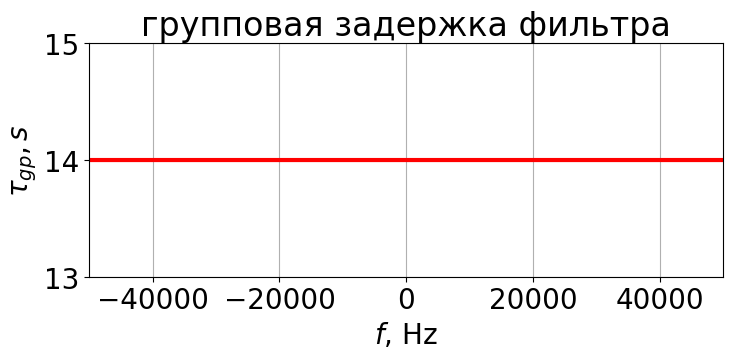

In [51]:
nu, gd = signal.group_delay((h.real, [1]), w=np.linspace(-0.5+1e-6, 0.5-1e-6, num=2048), fs=fs)

fig, ax = plt.subplots(figsize=(8,4))
plt.title('групповая задержка фильтра')
plt.plot(nu*fs, gd*1, 'r', lw = 3)
plt.ylabel('$\\tau_{{gp}}, s$')
plt.xlabel('$f$, Hz')
plt.ylim([min(gd)-1, max(gd)+1])
plt.xlim(-fs/2, fs/2)
plt.grid()
plt.tight_layout()

Групповая задержка действительно константна, как было сказано в пункте 1.1 В\).

## Задача 1.2. Синтез ФНЧ по непрерывной АЧХ.

Синтезировать КИХ-фильтр 28 порядка ($N=29$) на основе идеального фильтра нижних частот с граничной частотой полосы пропускания $f_1$ и с граничной частотой полосы задерживания $f_2$ методом частотной выборки. Частоту дискретизации принять равной $f_s$. Частотную характеристику идеального фильтра в полосе перехода аппроксимировать линейной функцией так, чтобы характеристика была непрерывной.

а) Определить максимальные уровни пульсаций $\delta_1$ и $\delta_2$ в полосе пропускания и в полосе задерживания. Сравнить с результатом в задаче 1.1.

б) Изобразить на одном графике АЧХ фильтра и отсчеты ДПФ. 

в) Построить импульсную характеристику полученного КИХ-фильтра. Определить по виду импульсной характеристики, будет ли 
фильтр обладать постоянной фазовой и группой задержками.

г) Получить график для групповой задержки фильтра. Сравнить с выводом в пункте (в).

д) Определить частоту среза (по уровню $-3$ дБ) модельного и полученного фильтров. 

##### 1.2 Б) Изображённый АЧХ фильтра и отсчёты ДПФ

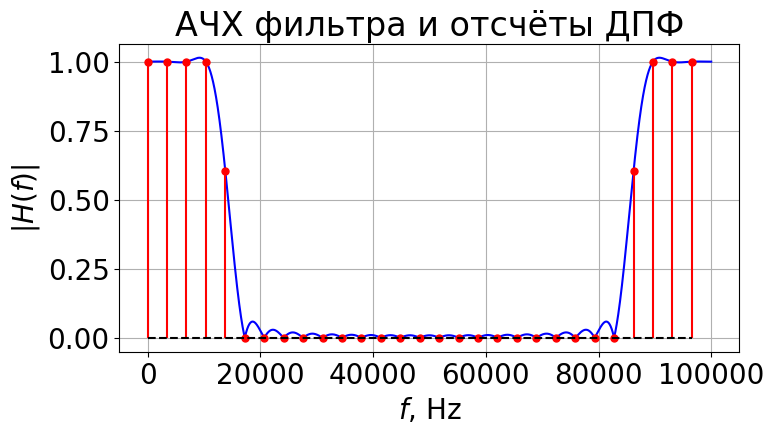

In [52]:
import warnings

fc = (f1 + f2)/2
N = 29

@np.vectorize
def ideal_lowpass_continuous(f, fs, f1, f2):
    warnings.filterwarnings('ignore')
    if 0 <= f <= f1 or fs-f1 <= f <=  fs:
        res = 1.0
    elif f1 < f < f2: 
        res = f/(f1-f2)+(f2/(f2-f1))
    elif fs-f2 < f < fs-f1:
        res = f/(f2-f1)+(fs-f2)/(-f2+f1)
    else:
        res = 0.0

    warnings.filterwarnings('default')
    return res

plt.figure(figsize=(8,4))

H = ideal_lowpass_continuous(fs*np.arange(N)/N, fs=fs, f1=f1, f2=f2)
h = np.roll(np.fft.ifft(H), N//2)
M = 1024*8
H1 = abs(np.fft.fft(h, M))

plt.plot(fs*(np.arange(M)/M), abs(H1), color = 'blue')

ml, sl, bl = plt.stem(fs*np.arange(N)/N, abs(H), 'r', basefmt = 'k--', markerfmt = 'ro')
plt.setp(ml, markersize = 5)

if False:
    plt.axvline(x=fc, label='fc')
    plt.axvline(x=f1, label='f1')
    plt.axvline(x=f2, label='f2')
    plt.legend()

plt.xlabel("$f$, Hz")
plt.ylabel("$|H(f)|$")
plt.title("АЧХ фильтра и отсчёты ДПФ")
plt.grid()
plt.show()
plt.close()


f_band = np.linspace(0, fs, 10240)

##### 1.2 А) Максимальные уровни пульсаций $\delta_1$ и $\delta_2$ в полосе пропускания и в полосе задерживания. 

In [53]:
print(f"макс пульсация в полосе пропускания = {np.round(np.max(20*np.log10(abs(abs(H1)[np.where(fs*(np.arange(M)/M)<=f1)]-1))),1)} дБ")
print(f"макс пульсация в полосе задерживания = {np.round(np.max(20*np.log10(abs(H1))[np.logical_and(fs*np.arange(M)/M>=f2,fs*(np.arange(M)/M)<=fs-f2)]),1)} дБ")

макс пульсация в полосе пропускания = -12.1 дБ
макс пульсация в полосе задерживания = -9.0 дБ


##### 1.2 В) Импульсная характеристика КИХ-фильтра. Определить по виду импульсной характеристики, будет ли фильтр обладать постоянной фазовой и группой задержками.

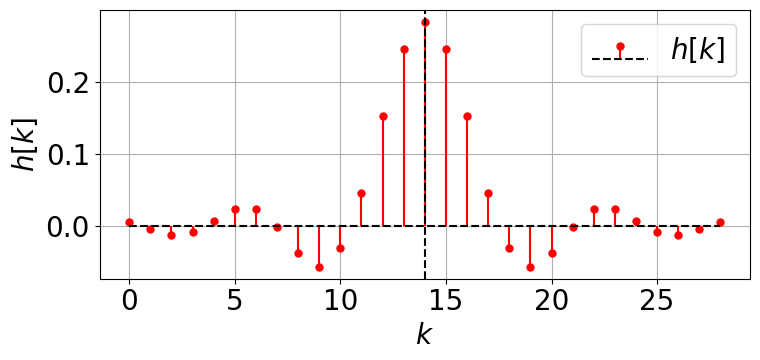

In [54]:
fig, ax = plt.subplots(figsize=(8, 4))
H = ideal_lowpass_continuous(fs*np.arange(N)/N, fs=fs, f1=f1, f2=f2)
h = np.roll(np.fft.ifft(H), N//2)
ml, sl, bl = plt.stem(np.arange(N), h.real, 'r', basefmt = 'k--', markerfmt = 'ro', 
                          label="$h[k]$")
plt.setp(ml, markersize = 5)
plt.axvline(N//2, ls = '--', color = 'black')
    
plt.grid()
plt.ylabel('$h[k]$')
plt.xlabel('$k$')

plt.legend(loc = 'best')
plt.tight_layout()
plt.show()
plt.close()

| Параметр  | Значение |
|-----------|----------|
| N = 29    | нечет |
| h[k]      | симметрична |

=> тип1 - фильтр обладает постоянной групповой и фазовой задержкой

##### 1.2 Г) график для групповой задержки фильтра

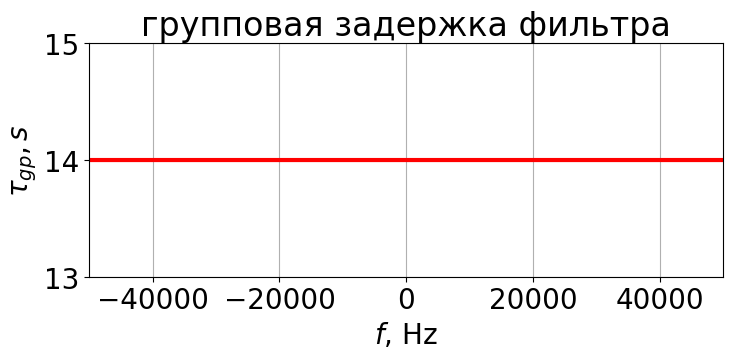

In [55]:
nu, gd = signal.group_delay((h.real, [1]), w=np.linspace(-0.5+1e-6, 0.5-1e-6, num=2048), fs=fs)

fig, ax = plt.subplots(figsize=(8,4))
plt.title('групповая задержка фильтра')
plt.plot(nu*fs, gd*1, 'r', lw = 3)
plt.ylabel('$\\tau_{{gp}}, s$')
plt.xlabel('$f$, Hz')
plt.ylim([min(gd)-1, max(gd)+1])
plt.xlim(-fs/2, fs/2)
plt.grid()
plt.tight_layout()

Групповая задержка постоянна.

##### 1.2Д) Частота среза (по уровню $-3$ дБ) модельного и полученного фильтров. 

In [56]:
y_target = -3

y_current = 20 * np.log10(abs(H1))
y_ideal = 20 * np.log10(abs(ideal_lowpass_continuous(f_band, fs=fs, f1=f1, f2=f2)))

indices_H1 = np.where(np.isclose(y_current, y_target, atol=0.1))[0]
indices_model = np.where(np.isclose(y_ideal, y_target, atol=0.1))[0]

x_H1 = np.round(fs * (indices_H1 / M)[0])
x_model = np.round(f_band[indices_model][0])

fig = go.Figure()
fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M), y=y_current, showlegend = True,
                        mode = 'lines', line = dict(dash='solid'), 
                        name=f'текущий, частота среза по уровню -3дБ = {x_H1} Гц'))
fig.add_trace(go.Scatter(x=f_band, y = y_ideal, showlegend = True,
                        mode = 'lines', line = dict(dash='solid'), 
                        name=f'модельный, частота среза по уровню -3дБ = {x_model} Гц'))

if False:
    fig.add_trace(go.Scatter(x=[fc]*2, y=[-100, 10], showlegend = False,
                            mode = 'lines', line = dict(dash='dot', color = 'black')))
    fig.add_trace(go.Scatter(x=[f1]*2, y=[-100, 10], showlegend = False,
                            mode = 'lines', line = dict(dash='dash', color = 'black')))
    fig.add_trace(go.Scatter(x=[f2]*2, y=[-100, 10], showlegend = False,
                            mode = 'lines', line = dict(dash='dash', color = 'black')))

fig.update_yaxes(title_text="|H(f)|, dB")
fig.update_xaxes(title_text="f, Hz")
if True:
    fig.update_xaxes(range=[0,20000])
    fig.update_yaxes(range=[-3.5, 0])
else:
    fig.update_yaxes(range=[-40, 5])

fig.update_xaxes(showspikes=True, spikecolor="red", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="red", spikesnap="cursor", spikemode="across", spikethickness=2)

fig.update_layout(height=400, width=1200)
fig.update_layout(hoverlabel_namelength=-1)
fig.show()



/tmp/ipykernel_76300/385173252.py:4: RuntimeWarning:

divide by zero encountered in log10



## Задача 1.3. Синтез фильтра с характеристикой «приподнятый косинус»

Синтезировать КИХ-фильтр 28 порядка ($N=29$) с частотой среза $f_c=(f_1+f_2)/2$  на основе фильтра приподнятого косинуса методом частотной выборки. Частоту дискретизации принять равной $f_s$. На интервале $[-f_s/2, f_s/2]$ частотная характеристика фильтра задается следующим образом 

$$H(f)=\left\{ \begin{matrix}
   1, & |f| < (1-\beta)f_c;\\
   \dfrac{1}{2}*\left( 1+\cos \left(\pi \dfrac{|f|-(1-\beta)f_c}{2\beta f_c} \right) \right), & (1-\beta) f_c \le |f| \le (1+\beta)f_c;  \\
   0,   &  |f| > (1+\beta)f_c. \\
\end{matrix} \right.$$

а) Подобрать такое $\beta$, чтобы модельный фильтр не выходил за максимально допустимые отклонения АЧХ в полосе пропускания и в полосе задерживания ($\delta_1$ и $\delta_2$). Изобразить полученную АЧХ фильтра.

б) Для синтезированного фильтра определить максимальные уровни пульсаций $\delta_1$ и $\delta_2$ в полосе пропускания и в полосе задерживания. Сравнить с результатами в задаче 1.1 и задаче 1.2.

в) Изобразить на одном графике АЧХ фильтра и отсчеты ДПФ. 

г) Построить импульсную характеристику полученного КИХ-фильтра. Определить по виду импульсной характеристики, будет ли 
фильтр обладать постоянной фазовой и группой задержками.

д) Получить график для групповой задержки фильтра. Сравнить с выводом в пункте (г).

е) Определить частоту среза (по уровню $-3$ дБ) полученного фильтра. Сравнить с задачей 1.2.


##### 1.3A) Подбор такого $\beta$, чтобы модельный фильтр не выходил за максимально допустимые отклонения АЧХ в полосе пропускания и в полосе задерживания ($\delta_1$ и $\delta_2$). АЧХ фильтра.

In [57]:
@np.vectorize
def ideal_rc(f, beta, fc, fs):
    if f > 0.5*fs:
        f = fs - f
    
    if abs(f) <= (1 - beta)*fc:
        return 1.0
    elif abs(f) > (1 + beta)*fc: 
        return 0.0
    else:
        return 0.5 * (1 + np.cos(np.pi*(abs(f) - (1-beta)*fc)/(2*beta*fc)))

fig = go.Figure()
fig.add_trace(go.Scatter(x=[-fs/2, -f2, -f2], y=[20*np.log10(delta2), 20*np.log10(delta2), 10],
                         legendgroup = 'bounds', showlegend = True, 
                         mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[f2, f2, fs/2], y=[10, 20*np.log10(delta2), 20*np.log10(delta2)], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], 
                        legendgroup = 'bounds', showlegend = True,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))

f_band = np.linspace(-fs/2., fs/2., 10240)
for beta in [0.08, 0.085, 0.09]:
    fig.add_trace(go.Scatter(x=f_band, y=20*np.log10(abs(ideal_rc(f_band, beta = beta, fc = fc, fs = fs))), 
                              mode = 'lines', line = dict(dash='dash'), name = f'ideal RC, beta = {round(beta, 3)}'))
    H = ideal_rc(fs*(np.arange(N)/N-0.5), beta = beta, fc = fc, fs = fs)
    h = np.roll(np.fft.ifft(H), N//2)
    M = 1024*8
    H1 = abs(np.fft.fft(h, M))
    fig.add_trace(go.Scatter(x=fs*((np.arange(M)/M)-0.5), y=20*np.log10(abs(H1)),
                        mode = 'lines', line = dict(dash='solid'), name = f'RC, beta = {round(beta, 3)}'))
    

beta = 0.08
fig.update_layout(title=dict(text=f"Chosen beta is {beta}"))
fig.update_yaxes(title_text="|H(f)|, dB")
fig.update_xaxes(title_text="f, Hz")
fig.update_yaxes(range=[-80, 10])
fig.update_xaxes(showspikes=True, spikecolor="red", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="red", spikesnap="cursor", spikemode="across", spikethickness=2)

fig.update_layout(height=400, width=800)
fig.update_layout(hoverlabel_namelength=-1)
fig.show()

/tmp/ipykernel_76300/2489122183.py:29: RuntimeWarning:

divide by zero encountered in log10



##### 1.3В) АЧХ фильтра и отсчеты ДПФ.

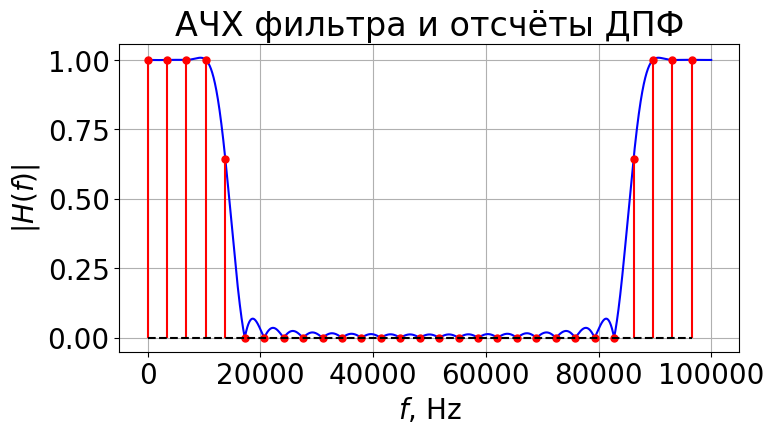

In [58]:
plt.figure(figsize=(8,4))

H = ideal_rc(fs*np.arange(N)/N, beta=beta, fc=fc, fs=fs)
h = np.roll(np.fft.ifft(H), N//2)
M = 1024*8
H1 = abs(np.fft.fft(h, M))

plt.plot(fs*(np.arange(M)/M), abs(H1), color = 'blue')

ml, sl, bl = plt.stem(fs*np.arange(N)/N, abs(H), 'r', basefmt = 'k--', markerfmt = 'ro')
plt.setp(ml, markersize = 5)

if False:
    plt.axvline(x=fc, label='fc')
    plt.axvline(x=f1, label='f1')
    plt.axvline(x=f2, label='f2')
    plt.legend()

plt.xlabel("$f$, Hz")
plt.ylabel("$|H(f)|$")
plt.title("АЧХ фильтра и отсчёты ДПФ")
plt.grid()
plt.show()
plt.close()


f_band = np.linspace(0, fs, 10240)

##### 1.3Б) Максимальные уровни пульсаций $\delta_1$ и $\delta_2$ в полосе пропускания и в полосе задерживания.

In [59]:
print(f"макс пульсация в полосе пропускания = {np.round(np.max(20*np.log10(abs(abs(H1)[np.where(fs*(np.arange(M)/M)<=f1)]-1))),1)} дБ")
print(f"макс пульсация в полосе задерживания = {np.round(np.max(20*np.log10(abs(H1))[np.logical_and(fs*np.arange(M)/M>=f2,fs*(np.arange(M)/M)<=fs-f2)]),1)} дБ")

макс пульсация в полосе пропускания = -13.4 дБ
макс пульсация в полосе задерживания = -8.2 дБ


##### 1.3Г) Импульсная характеристика КИХ-фильтра.

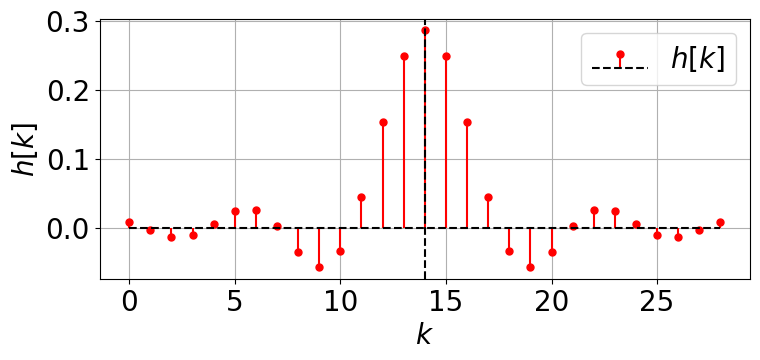

In [60]:
fig, ax = plt.subplots(figsize=(8, 4))
H = ideal_rc(fs*np.arange(N)/N, beta=beta, fc=fc, fs=fs)
h = np.roll(np.fft.ifft(H), N//2)
ml, sl, bl = plt.stem(np.arange(N), h.real, 'r', basefmt = 'k--', markerfmt = 'ro', 
                          label="$h[k]$")
plt.setp(ml, markersize = 5)
plt.axvline(N//2, ls = '--', color = 'black')
    
plt.grid()
plt.ylabel('$h[k]$')
plt.xlabel('$k$')

plt.legend(loc = 'best')
plt.tight_layout()
plt.show()
plt.close()

| Параметр  | Значение |
|-----------|----------|
| N = 29    | нечет |
| h[k]      | симметрична |

=> тип1 - фильтр обладает постоянной групповой и фазовой задержкой

##### 1.3Д) Групповая задержка фильтра.

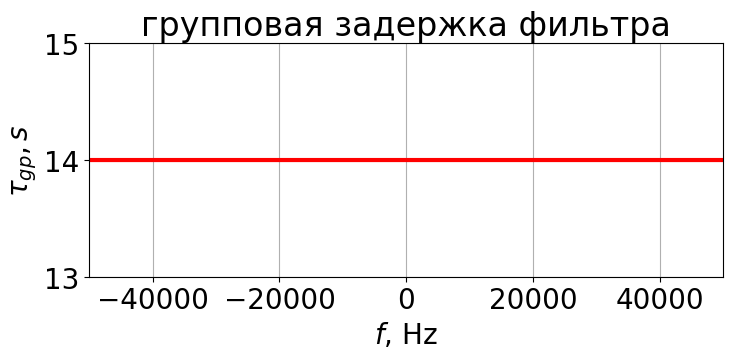

In [61]:
nu, gd = signal.group_delay((h.real, [1]), w=np.linspace(-0.5+1e-6, 0.5-1e-6, num=2048), fs=fs)

fig, ax = plt.subplots(figsize=(8,4))
plt.title('групповая задержка фильтра')
plt.plot(nu*fs, gd*1, 'r', lw = 3)
plt.ylabel('$\\tau_{{gp}}, s$')
plt.xlabel('$f$, Hz')
plt.ylim([min(gd)-1, max(gd)+1])
plt.xlim(-fs/2, fs/2)
plt.grid()
plt.tight_layout()

Групповая задержка постоянна.

##### 1.3E) Частота среза (по уровню $-3$ дБ) полученного фильтра.

In [62]:
y_target = -3

y_current = 20 * np.log10(abs(H1))
y_ideal = 20 * np.log10(abs(ideal_rc(f_band, beta=beta, fc=fc, fs=fs)))

indices_H1 = np.where(np.isclose(y_current, y_target, atol=0.1))[0]
indices_model = np.where(np.isclose(y_ideal, y_target, atol=0.1))[0]

x_H1 = np.round(fs * (indices_H1 / M)[0])
x_model = np.round(f_band[indices_model][0])

fig = go.Figure()
fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M), y=y_current, showlegend = True,
                        mode = 'lines', line = dict(dash='solid'), 
                        name=f'текущий, частота среза по уровню -3дБ = {x_H1} Гц'))
fig.add_trace(go.Scatter(x=f_band, y = y_ideal, showlegend = True,
                        mode = 'lines', line = dict(dash='solid'), 
                        name=f'модельный, частота среза по уровню -3дБ = {x_model} Гц'))

if False:
    fig.add_trace(go.Scatter(x=[fc]*2, y=[-100, 10], showlegend = False,
                            mode = 'lines', line = dict(dash='dot', color = 'black')))
    fig.add_trace(go.Scatter(x=[f1]*2, y=[-100, 10], showlegend = False,
                            mode = 'lines', line = dict(dash='dash', color = 'black')))
    fig.add_trace(go.Scatter(x=[f2]*2, y=[-100, 10], showlegend = False,
                            mode = 'lines', line = dict(dash='dash', color = 'black')))

fig.update_yaxes(title_text="|H(f)|, dB")
fig.update_xaxes(title_text="f, Hz")
if True:
    fig.update_xaxes(range=[0,20000])
    fig.update_yaxes(range=[-3.5, 0])
else:
    fig.update_yaxes(range=[-40, 5])

fig.update_xaxes(showspikes=True, spikecolor="red", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="red", spikesnap="cursor", spikemode="across", spikethickness=2)

fig.update_layout(height=400, width=1200)
fig.update_layout(hoverlabel_namelength=-1)
fig.show()

/tmp/ipykernel_76300/949649610.py:4: RuntimeWarning:

divide by zero encountered in log10



#  Модуль 2. Метод окон для синтеза КИХ-фильтров

### Задача 2.1. Сравнение АЧХ фильтров одного порядка 
Синтезировать КИХ-фильтры нижних частот c частотой среза $f_c$ при частоте дискретизации $f_s$ порядка $R=28$ ($N=29$) с использованием следующих окон:

* прямоугольное (окно Дирихле)
$$w[k]=\left\{ \begin{matrix}
   1,  \\
   0,  \\
\end{matrix}\begin{matrix}
   \ \ 0\le k\le N-1;  \\
   \left\{ k<0 \right\}\cup \left\{ k\ge N \right\}.  \\
\end{matrix} \right.$$

* окно Ханна 
$$w[k]=\left\{ \begin{matrix}
   0,5-0,5\cos \dfrac{2\pi k}{N-1}, & 0\le k\le N-1;  \\
   0, &\left\{ k<0 \right\}\cup \left\{ k\ge N \right\}. \\
\end{matrix} \right.$$

* окно Хэмминга
$$w[k]=\left\{ \begin{matrix}
   0,54-0,46\cos \dfrac{2\pi k}{N-1}, & 0\le k\le N-1;  \\
   0, &\left\{ k<0 \right\}\cup \left\{ k\ge N \right\}. \\
\end{matrix} \right.$$

* окно Блэкмана
$$w[k]=\left\{ \begin{matrix}
   0,42-0,5\cos \dfrac{2\pi k}{N-1}+0,08\cos \dfrac{4\pi k}{N-1}, & 0\le k\le N-1;  \\
   0, &\left\{ k<0 \right\}\cup \left\{ k\ge N \right\}. \\
\end{matrix} \right.$$

Построить графики оконной функции $w[k]$, импульсной характеристики КИХ-фильтра $h[k]$, АЧХ КИХ-фильтра(в линейном масштабе и в дБ). Определить по графикам максимальный уровень пульсаций по полосе задерживания в дБ. Заполнить таблицу. Частоту среза определять по уровню -3дБ.

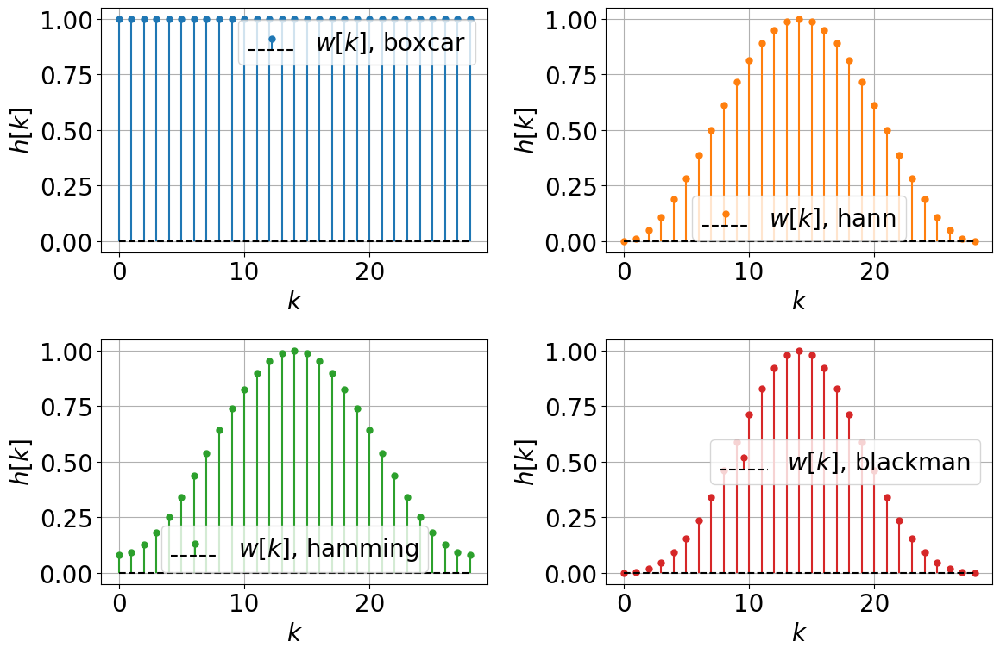

In [63]:
N = 29
fc=(f1+f2)/2

fig, ax = plt.subplots(2, 2, figsize=(12, 8))
for i, window in enumerate(['boxcar', 'hann', 'hamming', 'blackman']):
    plt.subplot(2, 2, i+1)
    w = signal.get_window(window = window, Nx = N, fftbins = False)
    ml, sl, bl = plt.stem(np.arange(N), w, 'C%d'%i, basefmt = 'k--', 
                          label="$w[k]$" + ', ' + window)
    plt.setp(ml, markersize = 5)
    
    plt.grid()
    plt.ylabel('$h[k]$')
    plt.xlabel('$k$')

    plt.legend(loc = 'best')
plt.tight_layout()
plt.show()
plt.close()

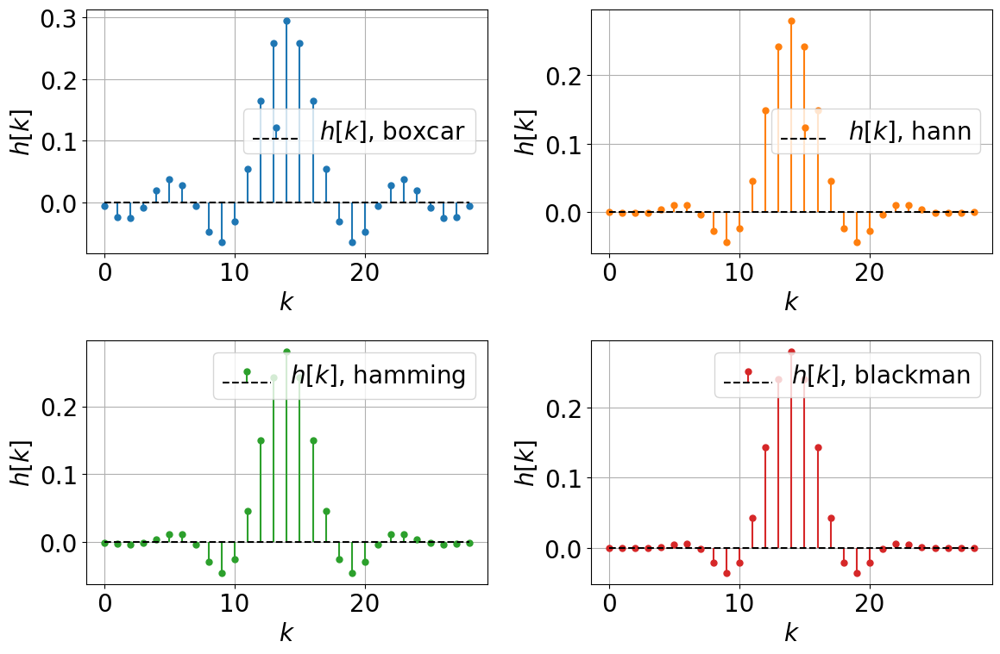

In [64]:
N = 29
fc=(f1+f2)/2

fig, ax = plt.subplots(2, 2,figsize=(12, 8))
for i, window in enumerate(['boxcar', 'hann', 'hamming', 'blackman']):
    plt.subplot(2, 2, i+1)
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window=window, pass_zero='lowpass', fs=fs)
    ml, sl, bl = plt.stem(np.arange(N), h, 'C%d'%i, basefmt = 'k--', markerfmt = 'o' + 'C%d'%i, 
                          label="$h[k]$" + ', ' + window)
    plt.setp(ml, markersize = 5)
    
    plt.grid()
    plt.ylabel('$h[k]$')
    plt.xlabel('$k$')

    plt.legend(loc = 'best')
plt.tight_layout()
plt.show()
plt.close()

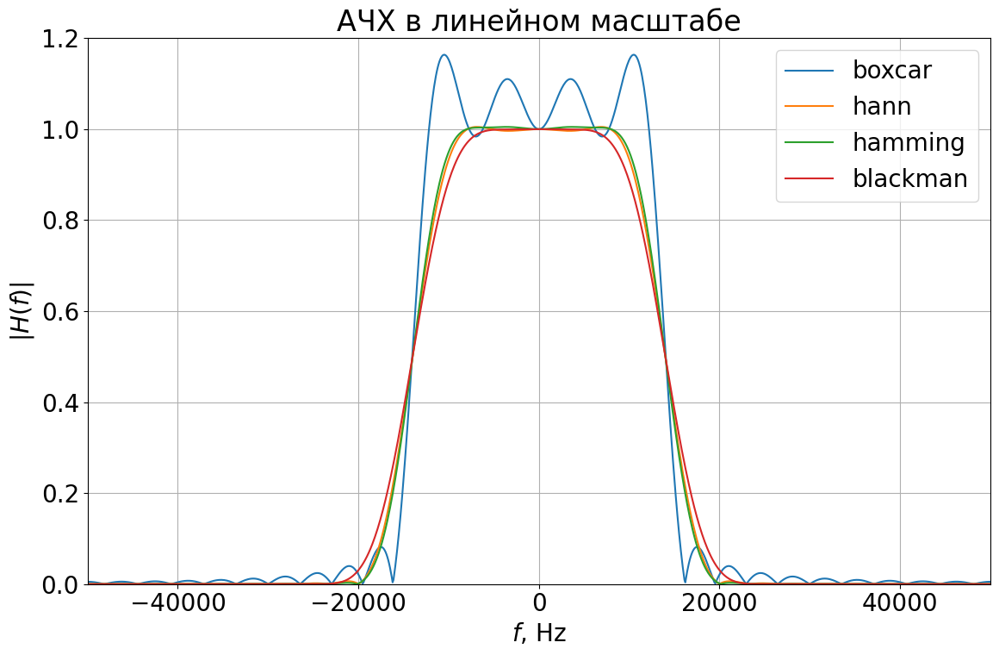

In [65]:
N = 29
fc=(f1+f2)/2

M=1024
fig, ax = plt.subplots(figsize=(12, 8))

for window in ['boxcar', 'hann', 'hamming', 'blackman']:
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window=window, pass_zero='lowpass', fs=fs)
    H = abs(np.fft.fftshift(np.fft.fft(h, M)))
    plt.plot(fs*(np.arange(M)/M-0.5), H, label = window)

plt.grid()
plt.ylabel('$|H(f)|$')
plt.xlabel('$f$, Hz')
plt.xlim([-fs/2, fs/2])
plt.ylim([0.0, 1.2])
plt.title("АЧХ в линейном масштабе")

plt.legend()
plt.tight_layout()
plt.show()
plt.close()

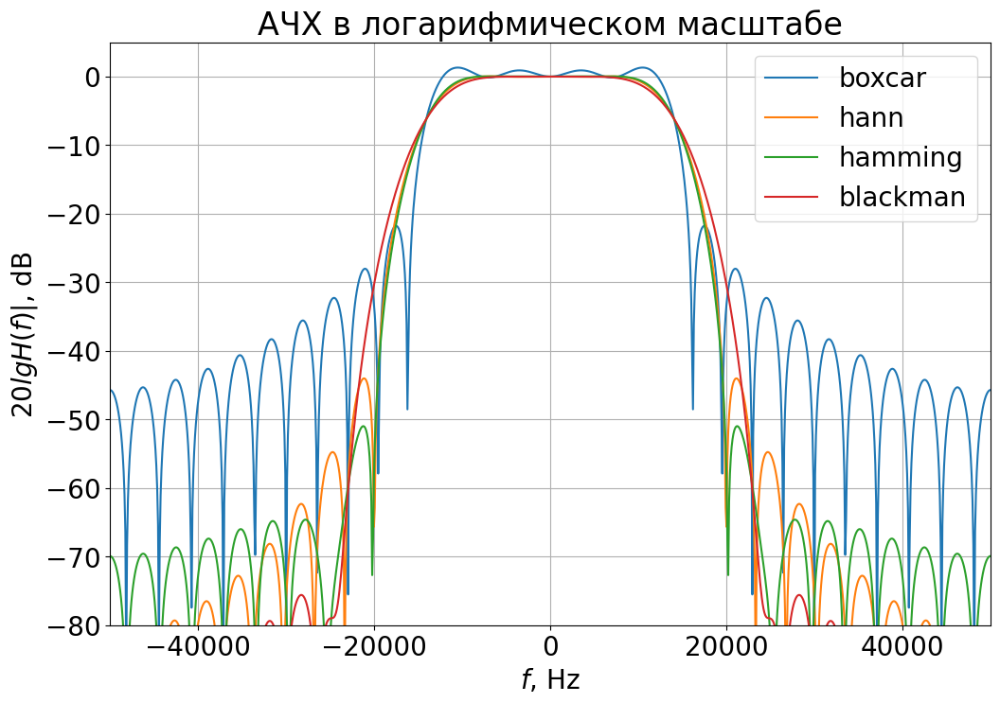

In [66]:
N = 29
fc=(f1+f2)/2

M=1024
fig, ax = plt.subplots(figsize=(12, 8))

# plt.axvline(+fc, ls = '--', color = 'black')

for window in ['boxcar', 'hann', 'hamming', 'blackman']:
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window=window, pass_zero='lowpass', fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))
    plt.plot(fs*(np.arange(M)/M-0.5), 20*np.log10(abs(H)), label = window)


plt.xlim([-fs/2, fs/2])
plt.xlabel("$f$, Hz")
plt.ylabel("$20 lg H(f)|$, dB")
plt.ylim(-80, 5)
plt.grid()
plt.legend(loc='upper right')
plt.title("АЧХ в логарифмическом масштабе")
plt.show()
plt.close()

In [67]:
fig = go.Figure()
fc=(f1+f2)/2

fig.add_trace(go.Scatter(x=[fc]*2, y=[-100, 10],
                        mode = 'lines', line = dict(dash='dash', color = 'black'), showlegend = False))
fig.add_trace(go.Scatter(x=[-fs/2, fs/2], y = [20*np.log10(1-delta1)]*2, name = 'passband bound', legendgroup = 'pass',
                        mode = 'lines', line = dict(dash='dot', color = 'black'), showlegend = True))
fig.add_trace(go.Scatter(x=[-fs/2, fs/2], y = [20*np.log10(1+delta1)]*2, legendgroup = 'pass',
                        mode = 'lines', line = dict(dash='dot', color = 'black'), showlegend = False))
fig.add_trace(go.Scatter(x=[-fs/2, fs/2], y = [20*np.log10(delta2)]*2,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
M=1024*8
for window in ['boxcar', 'hann', 'hamming', 'blackman']:
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window=window, pass_zero='lowpass', fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))
    y_cur = 20*np.log10(abs(H))
    fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M-0.5), y=y_cur,
                             mode = 'lines', line = dict(dash='solid'), name = window))
    print(f"макс пульсация в полосе задерживания для окна {window} = {np.max(y_cur[np.logical_and(fs*np.arange(M)/M>=f2,fs*(np.arange(M)/M)<=fs-f2)])} дБ")
fig.update_yaxes(title_text="|H(f)|, dB")
fig.update_xaxes(title_text="f, Hz")
fig.update_xaxes(range=[-fs/2, fs/2])
fig.update_yaxes(range=[-100, 10])
fig.update_xaxes(showspikes=True, spikecolor="red", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="red", spikesnap="cursor", spikemode="across", spikethickness=2)

fig.update_layout(height=400, width=800)
fig.update_layout(hoverlabel_namelength=-1)
fig.show()


макс пульсация в полосе задерживания для окна boxcar = 1.3167947851080044 дБ
макс пульсация в полосе задерживания для окна hann = 0.04360047052875586 дБ
макс пульсация в полосе задерживания для окна hamming = 0.04326518211141096 дБ
макс пульсация в полосе задерживания для окна blackman = 0.0 дБ


In [68]:
# заполненние таблицы через pandas
import pandas as pd
plot_data = {}
plot_data["Окно Дирихле"]  = ["13342", "1.32"]
plot_data["Окно Ханна"]    = ["12451", "0.04"]
plot_data["Окно Хэмминга"] = ["12585", "0.04"]
plot_data["Окно Блэкмана"] = ["12146", "0"]

df2_1 = pd.DataFrame(data=plot_data, columns = plot_data.keys(),
            index=['Частота среза фильтра, Гц', 'Максимальный уровень пульсаций  фильтра в полосе задерживания, дБ'])
# генерировать markdown таблицу 
# print(df2_1.to_markdown())
df2_1

,Окно Дирихле,Окно Ханна,Окно Хэмминга,Окно Блэкмана
"Частота среза фильтра, Гц",13342,12451,12585,12146
"Максимальный уровень пульсаций фильтра в полосе задерживания, дБ",1.32,0.04,0.04,0


### Задача 2.2. Синтез ФНЧ с окном Хемминга. 

Синтезировать КИХ-фильтр нижних частот с окном Хемминга наименьшего порядка при заданных требованиях к АЧХ:
* частота дискретизации $f_s$,
* граничная частота полосы пропускания $f_1$,
* граничная частота полосы задерживания $f_2$,
* максимально допустимое отклонение АЧХ в полосе пропускания $\delta_1$,
* максимально допустимое отклонение АЧХ в полосе задерживания $\delta_2$.

Воспользоваться следующей итерационной процедурой [1]:

1) Оценить длину окна по формуле 

$$\hat{N}=\left[\dfrac{3,3 f_s}{\Delta f} \right], \;\;  \Delta f=f_2-f_1$$

2) Взвесить импульсную характеристику идеального фильтра c ФЧХ $\varphi(\theta)=- \dfrac{R}{2} \theta$ окном Хэмминга выбранной длины (``scipy.firwin``, $f_c=(f_1+f_2)/2$).

$$h[k]=\left\{ \begin{matrix}
   {{h}_{\text{ideal}}}[k]w[k],  \\
   0,  \\
\end{matrix}\begin{matrix}
   \ \ 0\le k\le N-1;  \\
   \left\{ k<0 \right\}\cup \left\{ k\ge N \right\}.  \\
\end{matrix} \right.$$

$$w[k]=\left\{ \begin{matrix}
   0,54-0,46\cos \dfrac{2\pi k}{N-1}, & 0\le k\le N-1;  \\
   0, &\left\{ k<0 \right\}\cup \left\{ k\ge N \right\}. \\
\end{matrix} \right.$$

3) Проверить выполнение требований к АЧХ фильтра. Если требования не выполняются, следует увеличить порядок фильтра $R$ (на некоторое целое число) и перейти на п. 2. Если требования выполняются, то нужно уменьшить порядок фильтра  $R$ и перейти на п. 2. Уменьшение и увеличение порядка производится до тех пор, пока не будет найден минимальный порядок , при котором выполняются требования к АЧХ и уменьшение порядка на единицу приводит к нарушению требований к фильтру. 

Проверку требований к АЧХ можно произвести по графику, используя
* backend notebook `%matplotlib notebook` (в Jupyter Notebook)
* `plt.xlim()` и `plt.ylim()` (в Google Colab или в Jupyter Notebook)

Приведите графики АЧХ КИХ-фильтра с начальным ($\hat{R}=\hat{N}-1$) и конечным $R_\min$ порядками в итерационной процедуре. 
______

[1] Солонина, А. И. Цифровая обработка сигналов в зеркале MATLAB : учебное пособие / А. И. Солонина .— Санкт-Петербург : БХВ-Петербург, 2021 .— 560 с. — (Учебная литература для вузов).

P.S. Есть в библиотеке МФТИ. 
______

In [69]:
N = int(np.ceil(3.3*fs/(f2 - f1)))
print(f"{N=}")
fc=(f1+f2)/2

fig = go.Figure()

fig.add_trace(go.Scatter(x=[-fs/2, -f2, -f2], y=[20*np.log10(delta2), 20*np.log10(delta2), 10],
                         legendgroup = 'bounds', showlegend = True, 
                         mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[f2, f2, fs/2], y=[10, 20*np.log10(delta2), 20*np.log10(delta2)], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], 
                        legendgroup = 'bounds', showlegend = True,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))

M=1024*8

for i in range(10):
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window='hamming', pass_zero='lowpass', fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))

    if False:
      print(max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)), delta1)
      print(np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]), 20*np.log10(delta2))

    if max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)) <= delta1 and \
        np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]) <= 20*np.log10(delta2):
      fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M-0.5), y=20*np.log10(abs(H)), mode = 'lines', line = dict(dash='solid'), name = f"N = {N}, R = {N-1}"))
      N -= 5
    else:
      N += 1

fig.update_yaxes(title_text="|H(f)|, dB")
fig.update_xaxes(title_text="f, Hz")
fig.update_xaxes(range=[-fs/2, fs/2])
fig.update_yaxes(range=[-100, 10])
fig.update_xaxes(showspikes=True, spikecolor="red", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="red", spikesnap="cursor", spikemode="across", spikethickness=2)

fig.update_layout(height=800, width=1500,)
fig.update_layout(hoverlabel_namelength=-1)
fig.show()

N=165


/tmp/ipykernel_76300/4043025161.py:31: RuntimeWarning:

divide by zero encountered in log10

/tmp/ipykernel_76300/4043025161.py:32: RuntimeWarning:

divide by zero encountered in log10



In [70]:
print(max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)))

0.02405882492800826


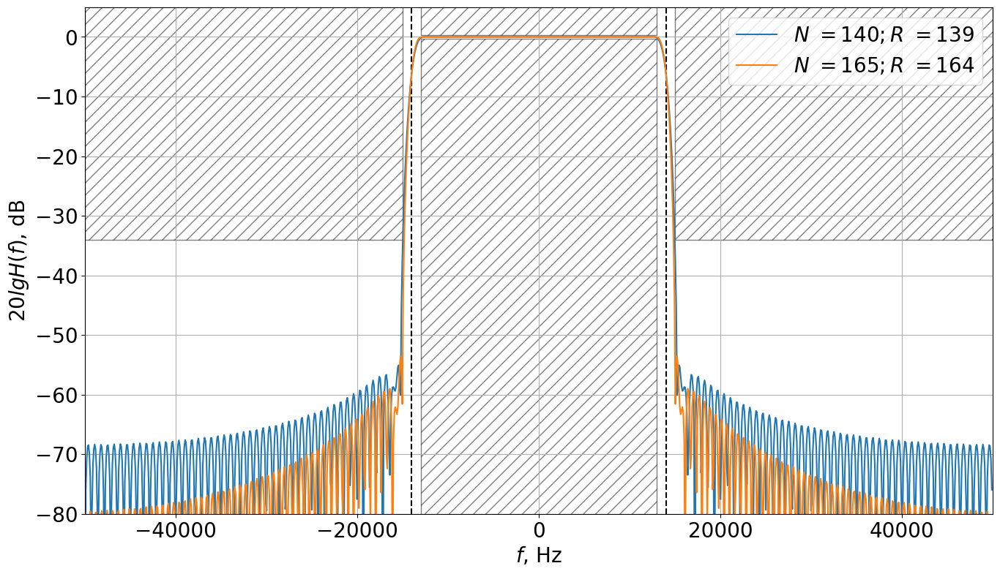

In [71]:
fc=(f1+f2)/2
M=1024
fig, ax = plt.subplots(figsize=(16, 9))

plt.axvline(+fc, ls = '--', color = 'black')
plt.axvline(-fc, ls = '--', color = 'black')

for N in [140, 165]:
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window='hamming', pass_zero='lowpass', fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))
    plt.plot(fs*(np.arange(M)/M-0.5), 20*np.log10(abs(H)), label = f'$N~ = {N}; R~ = {N-1}$')


plt.xlim([-fs/2, fs/2])
plt.xlabel("$f$, Hz")
plt.ylabel("$20 lg H(f)$, dB")

plt.fill([-f1,-f1, f1, f1], [-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-fs/2,-fs/2, -f2, -f2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([f2,f2, fs/2, fs/2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-f1,-f1, f1, f1], [10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')

plt.ylim(-80, 5)
plt.grid()
plt.legend(loc='upper right')
plt.show()
plt.close()

## Задача 2.3. Синтез ФНЧ с окном Кайзера.

Синтезировать КИХ-фильтр нижних частот с окном Кайзера наименьшего порядка при заданных требованиях к АЧХ :
* частота дискретизации $f_s$,
* граничная частота полосы пропускания $f_1$,
* граничная частота полосы задерживания $f_2$,
* максимально допустимое отклонение АЧХ в полосе пропускания $\delta_1$,
* максимально допустимое отклонение АЧХ в полосе задерживания $\delta_2$.

Параметр $\beta$ и длину окна $N$ определить по эмпирическим формулам, приведенным в лекции, или с помощью функции `signal.kaiserord`. Привести график АЧХ получившегося фильтра, сравнить порядок с фильтром из задачи 2.2. 

92 2.652339138368929


/tmp/ipykernel_76300/1060657209.py:17: RuntimeWarning:

divide by zero encountered in log10



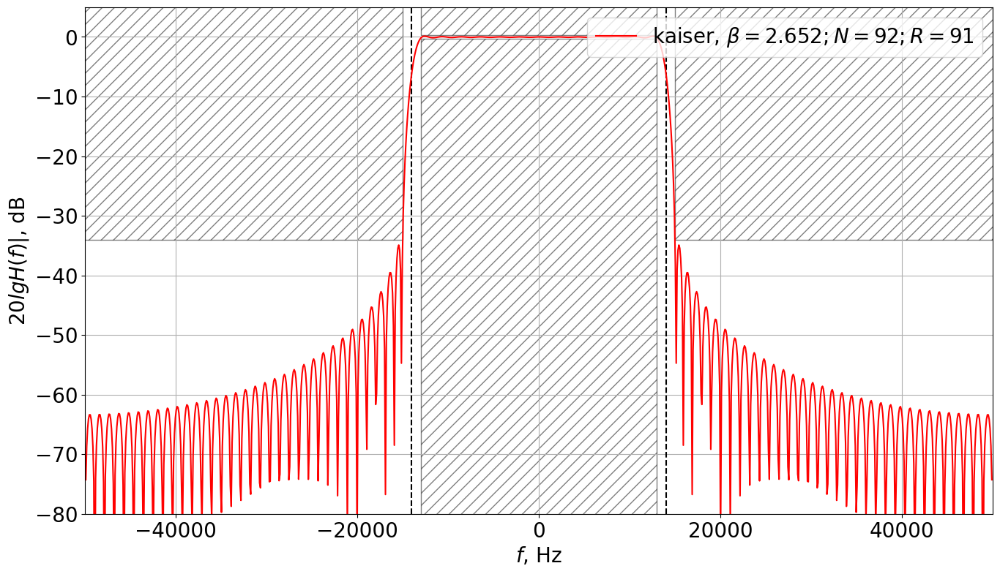

In [72]:
# Lecture taken
# print(int(np.ceil((-20*np.log10(delta2) - 7.95) * 0.5*fs/(2.285 * np.pi * (f2 - f1)))), 0.5842*(-20*np.log10(delta2)-21)**0.4 + 0.07886*(-20*np.log10(delta2)-21))
# signal.kaiserord usage
N, beta=signal.kaiserord(ripple=-20*np.log10(delta2), width=2*(f2-f1)/fs)
print(N, beta)

fc=(f1+f2)/2

M=1024
fig, ax = plt.subplots(figsize=(16, 9))

plt.axvline(+fc, ls = '--', color = 'black')
plt.axvline(-fc, ls = '--', color = 'black')

h = signal.firwin(numtaps=N, cutoff=fc, width=None, window=('kaiser', beta), pass_zero='lowpass', fs=fs)
H=abs(np.fft.fftshift(np.fft.fft(h, M)))
plt.plot(fs*(np.arange(M)/M-0.5), 20*np.log10(abs(H)), 'r', label = f'kaiser, $\\beta = {round(beta, 3)}; N = {N}; R = {N-1}$')


plt.xlim([-fs/2, fs/2])
plt.xlabel("$f$, Hz")
plt.ylabel("$20 lg H(f)|$, dB")

plt.fill([-f1,-f1, f1, f1], [-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-fs/2,-fs/2, -f2, -f2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([f2,f2, fs/2, fs/2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-f1,-f1, f1, f1], [10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')

plt.ylim(-80, 5)
plt.grid()
plt.legend(loc='upper right')
plt.show()

#  Модуль 3. Оптимизационные методы синтеза КИХ-фильтров

## Задача 3.1. Метод наименьших квадратов.

Синтезировать КИХ-фильтр методом наименьших квадратов наименьшего порядка при заданных требованиях к АЧХ :
* частота дискретизации $f_s$,
* граничная частота полосы пропускания $f_1$,
* граничная частота полосы задерживания $f_2$,
* максимально допустимое отклонение АЧХ в полосе пропускания $\delta_1$,
* максимально допустимое отклонение АЧХ в полосе задерживания $\delta_2$.

Использовать следующую итерационную процедуру:

1) Выбрать начальный порядок фильтра $R$ (например, можно взять результат решения задачи 2.3).

2) Используя функцию `scipy.signal.firls`, синтезировать КИХ-фильтр порядка $R$ методом наименьших квадратов.

3) Проверить выполнение требований к АЧХ фильтра. Если требования не выпоняются, следует увеличить порядок фильтра $R$ (на некоторое целое число) и перейти на п. 2. Если требования выполняются, то нужно уменьшить порядок фильтра  $R$ и перейти на п. 2. Уменьшение и увеличение порядка производится до тех пор, пока не будет найден минимальный порядок , при котором выполняются требования к АЧХ и уменьшение порядка на единицу приводит к нарушению требований к фильтру. 

Приведите график АЧХ КИХ-фильтра минимального порядка $R_\min$ в итерационной процедуре. 

In [73]:
bands = np.array([0, f1, f2, fs/2])
desired = np.array([1, 1, 0, 0])
weight = np.array([delta2, delta1])*10

In [74]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=[-fs/2, -f2, -f2], y=[20*np.log10(delta2), 20*np.log10(delta2), 10],
                         legendgroup = 'bounds', showlegend = True, 
                         mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[f2, f2, fs/2], y=[10, 20*np.log10(delta2), 20*np.log10(delta2)], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], 
                        legendgroup = 'bounds', showlegend = True,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))

M=1024*8
N = 165
i = 0
iter = 5
while i <= iter:
    h=signal.firls(numtaps=N, bands=bands, desired=desired, weight=weight, fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))
    if False:
      fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M-0.5), y=abs(H), mode = 'lines', line = dict(dash='solid'), name = f"N = {N}, R = {N-1}"))

    if False:
      print(max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)), delta1)
      print(np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]), 20*np.log10(delta2))

    if max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)) <= delta1 and \
        np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]) <= 20*np.log10(delta2):
      fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M-0.5), y=20*np.log10(abs(H)), mode = 'lines', line = dict(dash='solid'), name = f"N = {N}, R = {N-1}"))
      N -= 4
    else:
      N += 2
    i += 1

fig.update_yaxes(title_text="|H(f)|, dB")
fig.update_xaxes(title_text="f, Hz")
fig.update_xaxes(range=[-fs/2, fs/2])
fig.update_yaxes(range=[-100, 10])
fig.update_xaxes(showspikes=True, spikecolor="red", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="red", spikesnap="cursor", spikemode="across", spikethickness=2)

fig.update_layout(height=800, width=1200,)
fig.update_layout(hoverlabel_namelength=-1)
fig.show()

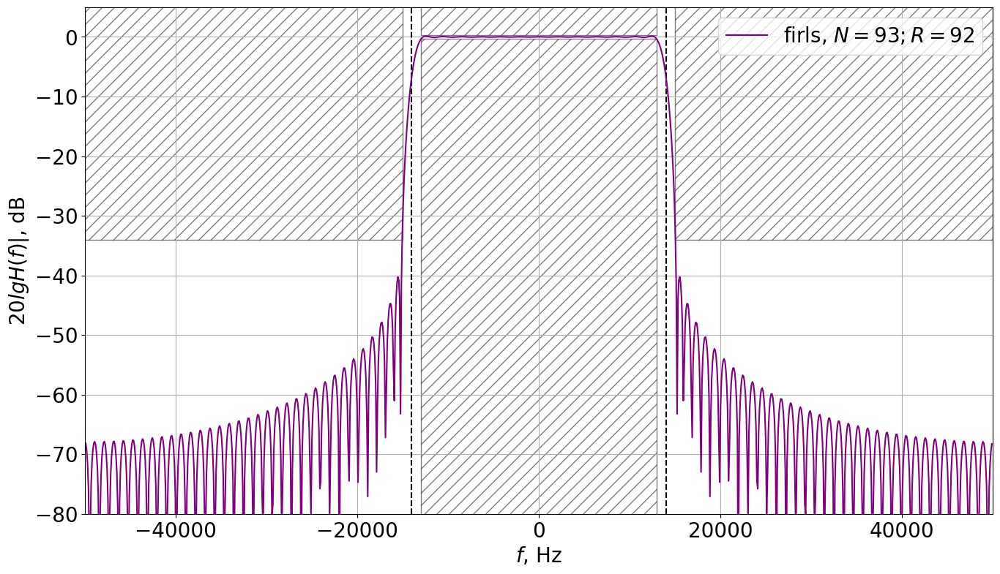

In [75]:
fc=(f1+f2)/2

M=1024
fig, ax = plt.subplots(figsize=(16, 9))

plt.axvline(+fc, ls = '--', color = 'black')
plt.axvline(-fc, ls = '--', color = 'black')

N = 93
h = signal.firls(numtaps=N, bands=bands, desired=desired, weight=weight, fs=fs)
H=abs(np.fft.fftshift(np.fft.fft(h, M)))
plt.plot(fs*(np.arange(M)/M-0.5), 20*np.log10(abs(H)), 'purple', label = f'firls, $N = {N}; R = {N-1}$')


plt.xlim([-fs/2, fs/2])
plt.xlabel("$f$, Hz")
plt.ylabel("$20 lg H(f)|$, dB")

plt.fill([-f1,-f1, f1, f1], [-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-fs/2,-fs/2, -f2, -f2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([f2,f2, fs/2, fs/2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-f1,-f1, f1, f1], [10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')

plt.ylim(-80, 5)
plt.grid()
plt.legend(loc='upper right')
plt.show()

## Задача 3.2. Метод равномерной чебышевской аппроксимации.

Синтезировать КИХ-фильтр методом равномерной чебышевской аппроксимации наименьшего порядка при заданных требованиях к АЧХ :
* частота дискретизации $f_s$,
* граничная частота полосы пропускания $f_1$,
* граничная частота полосы задерживания $f_2$,
* максимально допустимое отклонение АЧХ в полосе пропускания $\delta_1$,
* максимально допустимое отклонение АЧХ в полосе задерживания $\delta_2$.

Использовать следующую итерационную процедуру:

1) Выбрать начальный порядок фильтра $R$ (например, можно взять результат решения задачи 2.3).

2) Используя функцию `scipy.signal.remez`, синтезировать КИХ-фильтр порядка $R$ методом наименьших квадратов.

3) Проверить выполнение требований к АЧХ фильтра. Если требования не выпоняются, следует увеличить порядок фильтра $R$ (на некоторое целое число) и перейти на п. 2. Если требования выполняются, то нужно уменьшить порядок фильтра  $R$ и перейти на п. 2. Уменьшение и увеличение порядка производится до тех пор, пока не будет найден минимальный порядок , при котором выполняются требования к АЧХ и уменьшение порядка на единицу приводит к нарушению требований к фильтру. 

Приведите график АЧХ КИХ-фильтра минимального порядка $R_\min$ в итерационной процедуре. 

In [76]:
bands = np.array([0, f1, f2, fs / 2])
desired = np.array([1, 0])
weight = np.array([1 / delta2, 1 / delta1])

fig = go.Figure()

fig.add_trace(go.Scatter(x=[-fs/2, -f2, -f2], y=[20*np.log10(delta2), 20*np.log10(delta2), 10],
                         legendgroup = 'bounds', showlegend = True, 
                         mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[f2, f2, fs/2], y=[10, 20*np.log10(delta2), 20*np.log10(delta2)], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'stopband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], 
                        legendgroup = 'bounds', showlegend = True,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))
fig.add_trace(go.Scatter(x=[-f1, -f1, f1, f1], y=[10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], 
                        legendgroup = 'bounds', showlegend = False,
                        mode = 'lines', line = dict(dash='dot', color = 'black'), name = 'passband bound'))

M=1024*8
N = 165
i = 0
iter = 10

while i <= iter:
    h=signal.remez(numtaps=N, bands=bands, desired=desired, weight=weight, fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))
    if False:
      fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M-0.5), y=abs(H), mode = 'lines', line = dict(dash='solid'), name = f"N = {N}, R = {N-1}"))

    if False:
      print(max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)), delta1)
      print(np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]), 20*np.log10(delta2))

    if max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)) <= delta1 and \
        np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]) <= 20*np.log10(delta2):
      fig.add_trace(go.Scatter(x=fs*(np.arange(M)/M-0.5), y=20*np.log10(abs(H)), mode = 'lines', line = dict(dash='solid'), name = f"N = {N}, R = {N-1}"))
      N -= 4
    else:
      N += 2
    i += 1

fig.update_yaxes(title_text="|H(f)|, dB")
fig.update_xaxes(title_text="f, Hz")
fig.update_xaxes(range=[-fs/2, fs/2])
fig.update_yaxes(range=[-100, 10])
fig.update_xaxes(showspikes=True, spikecolor="red", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="red", spikesnap="cursor", spikemode="across", spikethickness=2)

fig.update_layout(height=800, width=1200,)
fig.update_layout(hoverlabel_namelength=-1)
fig.show()

## Задача 3.3. Сравнение результатов.

Сравнить минимальные порядки КИХ-фильтров, которые получились в задачах 2.2, 2.3, 3.1 и 3.2. Заполнить таблицу. Определить, будут ли выполняться требование из этих задач для фильтра минимального из получившихся порядков, построенного методом частотной выборки (как в задаче 1.2).


In [77]:
# заполненние таблицы через pandas
import pandas as pd
plot_data = {}
plot_data["Оконный метод (окно Хэмминга)"]  = ["136", "137"]
plot_data["Оконный метод (окно Кайзера)"]    = ["139", "140"]
plot_data["Метод наименьших квадратов"] = ["144", "145"]
plot_data["Метод равномерной чебышевской аппроксимации"] = ["124", "125"]

df3_3 = pd.DataFrame(data=plot_data, columns = plot_data.keys(),
            index=["$$R_min$$", "$$N_min$$"]).T
# генерировать markdown таблицу 
# print(df3_3.to_markdown())
df3_3

,$$R_min$$,$$N_min$$
Оконный метод (окно Хэмминга),136,137
Оконный метод (окно Кайзера),139,140
Метод наименьших квадратов,144,145
Метод равномерной чебышевской аппроксимации,124,125


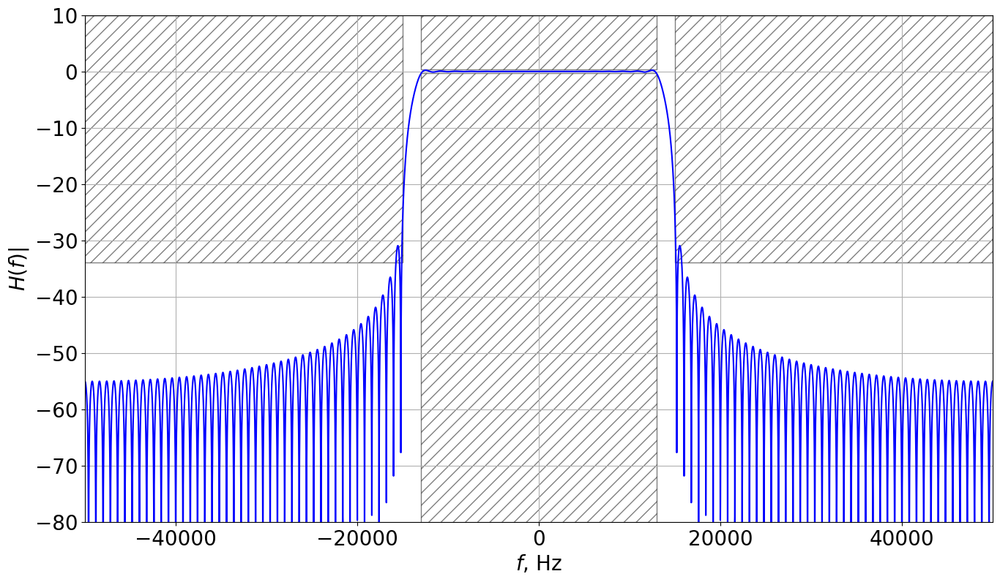

In [78]:
@np.vectorize
def ideal_lowpass_continuous(f, fs, f1, f2):
    if f <= 0:
        f = fs - f
    if 0 <= f <= f1 or fs-f1 <= f <=  fs:
        return 1.0
    elif f1 < f < f2: 
        return f/(f1-f2)+(f2/(f2-f1))
    elif fs-f2 < f < fs-f1:
        return f/(f2-f1)+(fs-f2)/(-f2+f1)
    else:
        return 0.0 
    
N=125
fc=(f1+f2)/2

plt.figure(figsize=(16, 9))
H = ideal_lowpass_continuous(fs*(np.arange(N)/N), fs = fs, f1 = f1, f2 = f2)
h = np.roll(np.fft.ifft(H), N//2)
M = 1024*8
H1 = abs(np.fft.fft(h, M))
plt.plot(fs*(-0.5 + np.arange(M)/M), 20*np.log10(abs(np.fft.fftshift(H1))), color = 'blue')
plt.fill([-f1,-f1, f1, f1], [-100, 20*np.log10(1-delta1), 20*np.log10(1-delta1), -100], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-fs/2,-fs/2, -f2, -f2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([f2,f2, fs/2, fs/2], [20*np.log10(delta2), 10, 10, 20*np.log10(delta2)], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')
plt.fill([-f1,-f1, f1, f1], [10, 20*np.log10(1+delta1), 20*np.log10(1+delta1), 10], edgecolor = 'k', hatch = '//',  alpha = 0.5, facecolor = 'white')

plt.xlim(-fs/2., +fs/2.)
plt.ylim(-80, 10)
plt.xlabel("$f$, Hz")
plt.ylabel("$H(f)|$")
plt.grid()
plt.show()

#  Модуль 4. Фильтрация сигнала.

## Задача 4.1. Фильтрация АМ-сигнала, полученного с помощью цифрового осциллографа.
Установить в управляющей программе цифрового осциллографа следующие параметры. 
* Число выборок 1000, режим "Нормально".
* Пробник "х1".
* Частота дискретизации 100 кГц (Время/дел 1mS) или 200 кГц (Время/дел 0,5mS) в соответствии с вариантом задания. 
* Синхронизация "Вкл." и "Авто".
* Генератор: Генератор: режим "АМ/ЧМ", вид "~", диапазон "10K", размах колебания 4В. Частоту генератора выбрать в соответствии с вариантом из таблицы. Установить частоту несущей $f_0$ в соответствии с вариантом задания. 
* Модуляция генератора (меню "Настройки"): режим "АМ", коэффициент модуляции 70%, модулирующая частота 1кГц. 

Выполнить следующую последовательность действий. 
1) Пронаблюдать сигнал с амплитудной модуляцией. 
2) Записать выборки в текстовый файл.
3) Синтезировать КИХ-фильтр одним из рассмотренных методов так, чтобы его АЧХ удовлетворяла условиям задачи. При этом не обязательно использовать фильтр наименьшего возможного порядка. 
4) Провести фильтрацию сигнала. Сравнить сигналы и спектры сигналов до и после фильтрации.
5) Определить групповую задержку фильтра в мс. 
6) Синтезировать БИХ-фильтр Баттерворта, удовлетворяющий тем же требованиям. Сравнить результаты фильтрации сигналов КИХ-фильтром и БИХ-фильтром во временной области.

##### 4.1.1-2:

Выборки выписаны в текстовый файл `data.txt`, сигнал выглядит так:

![data.bmp](./data.bmp)


In [79]:
# Need to parse input file:
input_file = "data.txt"

with open(input_file, "r") as ifile:
    lines = ifile.readlines()

data_start = next(i for i, line in enumerate(lines) if line.strip().startswith("0"))
input_data = np.array([int(line.split()[1]) for line in lines[data_start:]])
N = len(input_data)


Использую Хэмминга.

In [80]:
fc=(f1+f2)/2

M=1024*8

for i in range(5):
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window='hamming', pass_zero='lowpass', fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))

    if False:
      print(max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)), delta1)
      print(np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]), 20*np.log10(delta2))

    if max(abs(H[np.logical_and(fs*(np.arange(M)/M-0.5)>=0,fs*(np.arange(M)/M-0.5)<=f1)]-1)) <= delta1 and \
        np.max(20*np.log10(abs(H))[np.logical_and(fs*(np.arange(M)/M-0.5)>=f2,fs*(np.arange(M)/M-0.5)<=fs-f2)]) <= 20*np.log10(delta2):
      N -= 5
    else:
      N += 1

M=1024

for N in [140, 165]:
    h = signal.firwin(numtaps=N, cutoff=fc, width=None, window='hamming', pass_zero='lowpass', fs=fs)
    H=abs(np.fft.fftshift(np.fft.fft(h, M)))

h = np.roll(np.fft.ifft(H), N//2)

/tmp/ipykernel_76300/3433229625.py:14: RuntimeWarning:

divide by zero encountered in log10



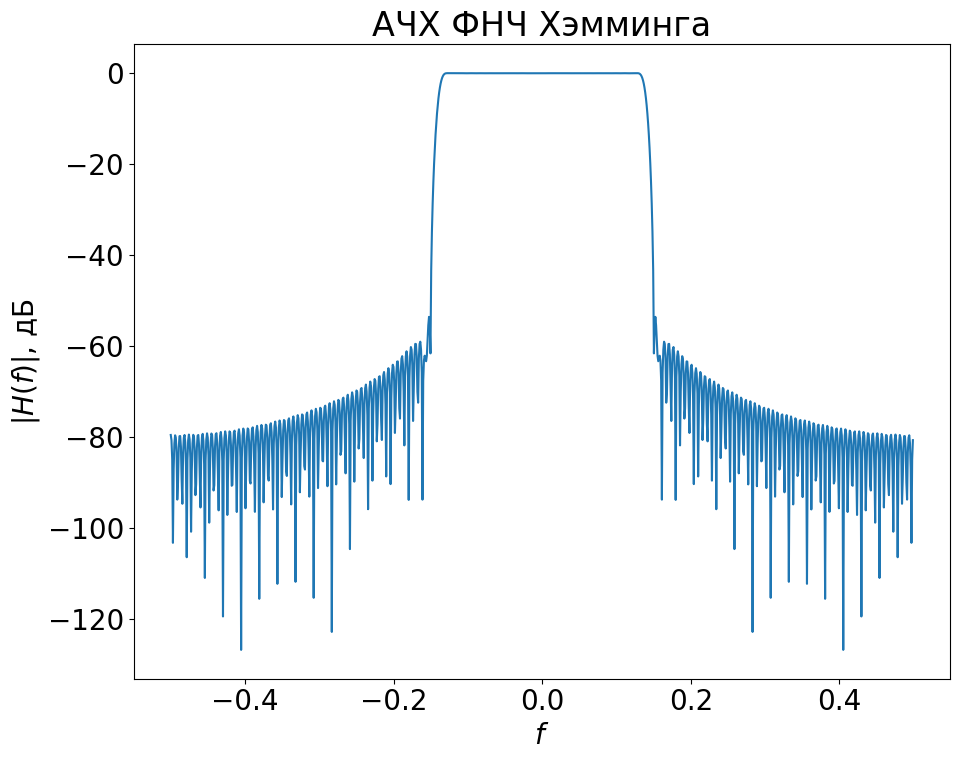

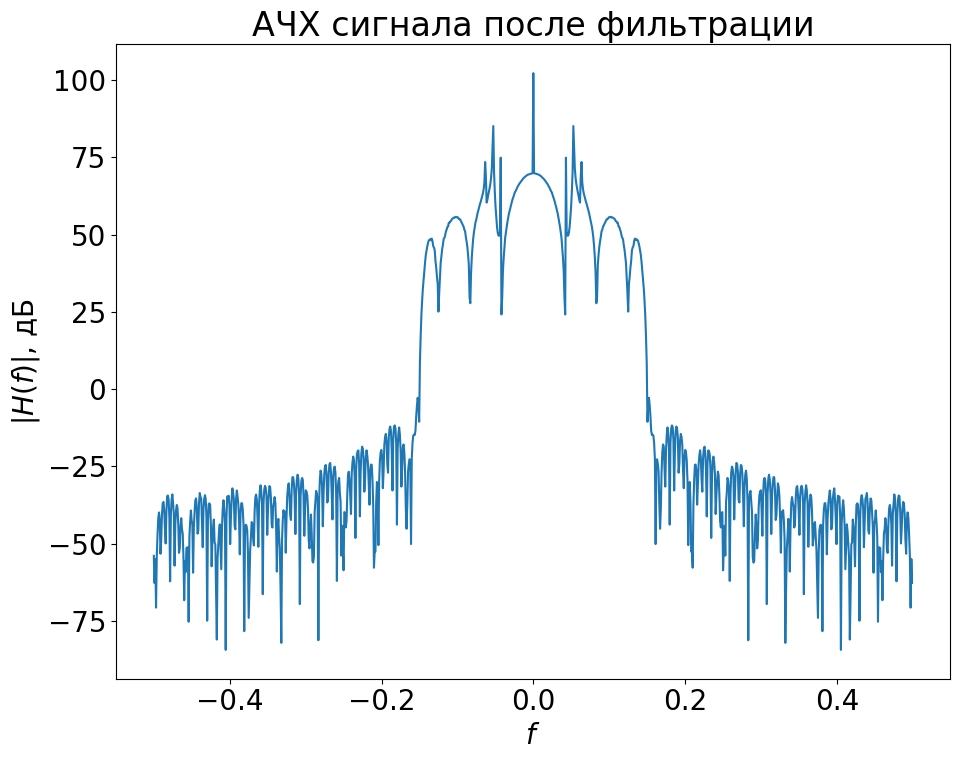

In [81]:
x_H = np.fft.fftshift(np.fft.fft(input_data, M))
f = -0.5 + np.arange(M) / M
x_H_filtered = x_H * H

plt.figure(figsize=[10,8])
plt.plot(f, 20 * np.log10(abs(H)))
plt.xlabel('$f$')
plt.ylabel('$|H(f)|$, дБ')
plt.title("АЧХ ФНЧ Хэмминга")
plt.tight_layout()
plt.show()
plt.close()

plt.figure(figsize=[10,8])
plt.plot(f, 20 * np.log10(abs(x_H_filtered)))
plt.xlabel('$f$')
plt.ylabel('$|H(f)|$, дБ')
plt.title("АЧХ сигнала после фильтрации")
plt.tight_layout()
plt.show()
plt.close()

##### Cравнение сигнала до/после фильтрации.

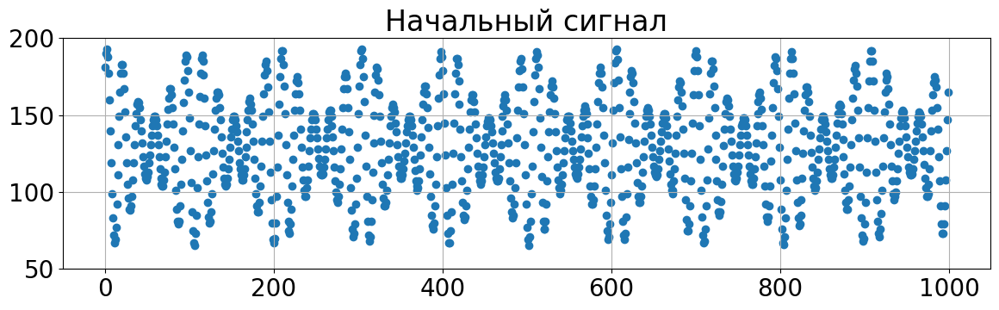

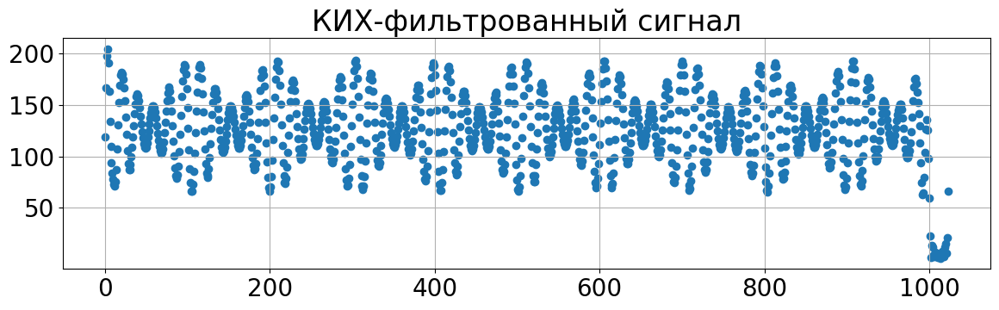

In [82]:
plt.figure(figsize=[12, 4])
plt.scatter(y = input_data, x = np.arange(0, len(input_data)))
plt.title("Начальный сигнал")
plt.yticks([50,100,150,200])
plt.grid()
plt.tight_layout()
plt.show()
plt.close()

filtered_spectrum = np.abs(np.fft.ifft(np.fft.ifftshift(x_H_filtered)))
plt.figure(figsize=[12, 4])
plt.scatter(y = filtered_spectrum, x = np.arange(0, len(filtered_spectrum)))
plt.title("КИХ-фильтрованный сигнал")
plt.yticks([50,100,150,200])
plt.grid()
plt.tight_layout()
plt.show()
plt.close()

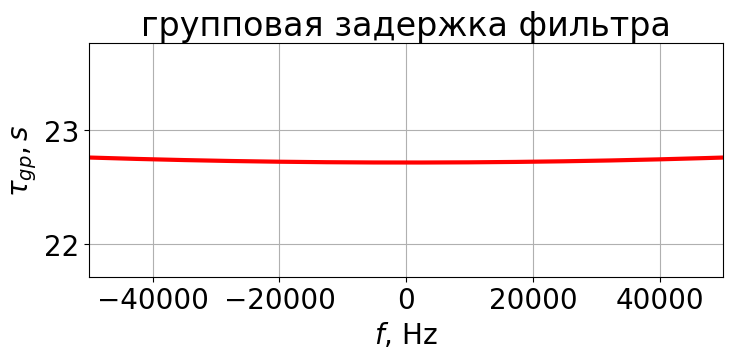

In [83]:
nu, gd = signal.group_delay((h.real, [1]), w=np.linspace(-0.5+1e-6, 0.5-1e-6, num=2048), fs=fs)

fig, ax = plt.subplots(figsize=(8,4))
plt.title('групповая задержка фильтра')
plt.plot(nu*fs, gd*1, 'r', lw = 3)
plt.ylabel('$\\tau_{{gp}}, s$')
plt.xlabel('$f$, Hz')
plt.ylim([min(gd)-1, max(gd)+1])
plt.xlim(-fs/2, fs/2)
plt.grid()
plt.tight_layout()

##### БИХ-фильтр Баттерворта.

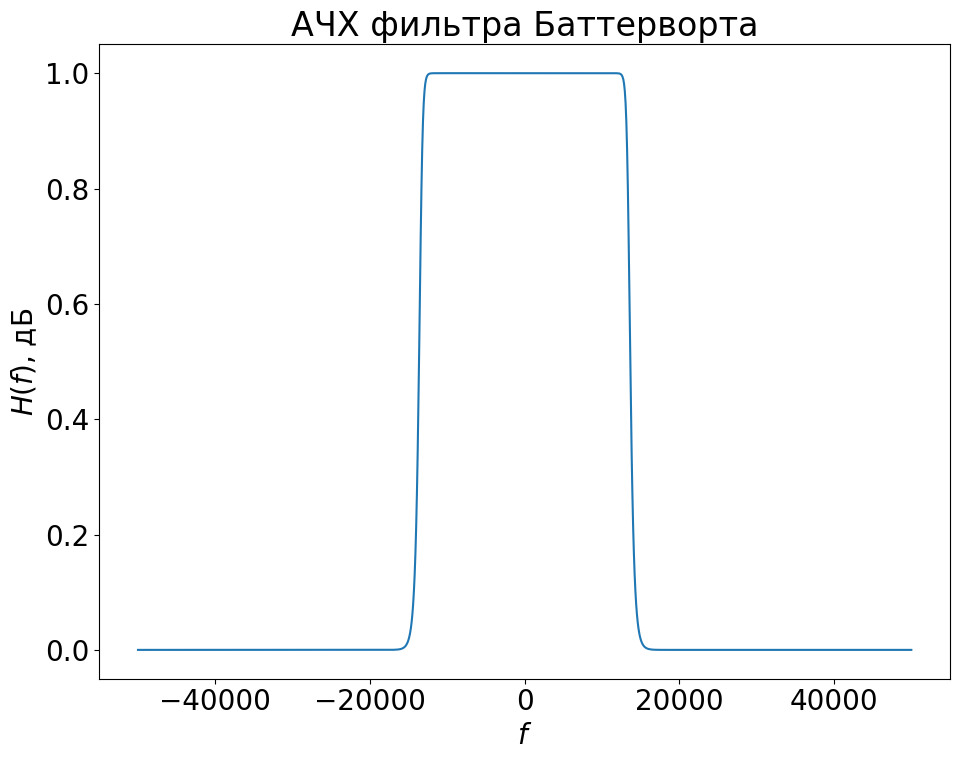

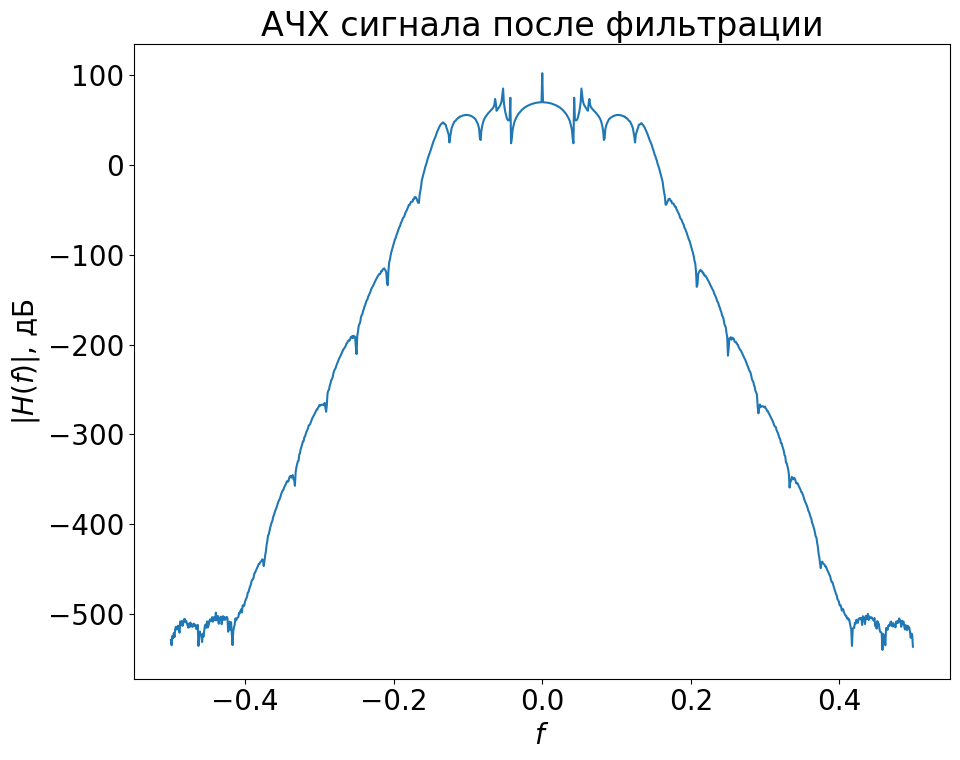

In [84]:
gpass = -20 * np.log10(1 - delta1)
gstop = -20 * np.log10(delta2)

N, Wn = signal.buttord(wp=f1, ws=f2, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta, alpha = signal.butter(N, Wn=Wn, btype='lowpass', analog=False, output='ba', fs=fs)
f, H = signal.freqz(beta, alpha, worN=np.linspace(-fs / 2, fs / 2, M), fs=fs)

plt.figure(figsize=[10,8])
plt.plot(f, abs(H))
plt.xlabel('$f$')
plt.ylabel('$H(f)$, дБ')
plt.title("АЧХ фильтра Баттерворта")
plt.tight_layout()
plt.show()
plt.close()

x_H = np.fft.fftshift(np.fft.fft(input_data, M))
f = -0.5 + np.arange(M) / M
x_H_filtered = x_H * H

plt.figure(figsize=[10,8])
plt.plot(f, 20 * np.log10(abs(x_H_filtered)))
plt.xlabel('$f$')
plt.ylabel('$|H(f)|$, дБ')
plt.title("АЧХ сигнала после фильтрации")
plt.tight_layout()
plt.show()
plt.close()

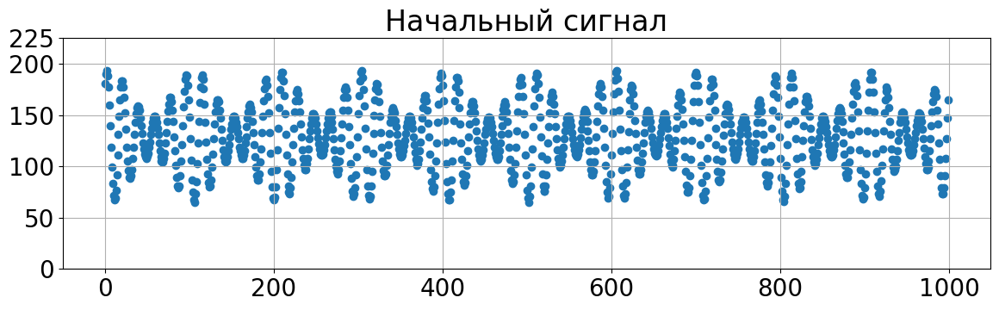

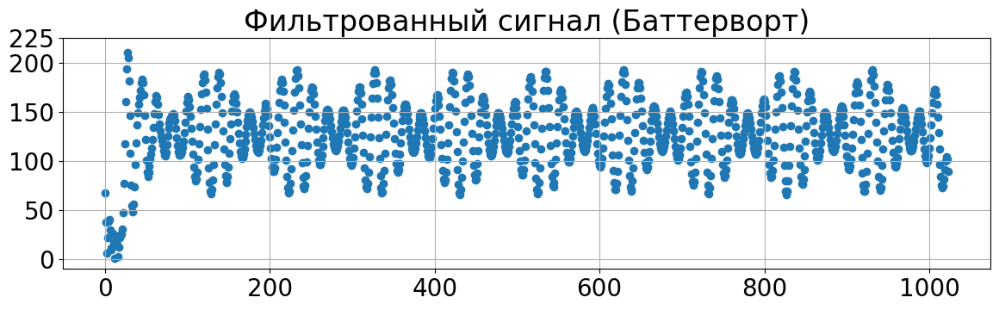

In [85]:
plt.figure(figsize=[12, 4])
plt.scatter(y = input_data, x = np.arange(0, len(input_data)))
plt.title("Начальный сигнал")
plt.yticks([0,50,100,150,200,225])
plt.grid()
plt.tight_layout()
plt.show()
plt.close()

filtered_spectrum = np.abs(np.fft.ifft(np.fft.ifftshift(x_H_filtered)))
plt.figure(figsize=[12, 4])
plt.scatter(y = filtered_spectrum, x = np.arange(0, len(filtered_spectrum)))
plt.title("Фильтрованный сигнал (Баттерворт)")
plt.yticks([0,50,100,150,200,225])
plt.grid()
plt.tight_layout()
plt.show()
plt.close()